In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/siim-acr-pneumothorax-segmentation/mask_functions.py
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_sample_submission.csv
/kaggle/input/siim-acr-pneumothorax-segmentation/download_images.py
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_train.csv
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_0dfa94b38.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_44f60f132.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_44a3db851.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_8d4493ddb.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_d4d801328.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_cf7c91827.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_0930d8b45.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_1b7e56f8f.dcm
/kaggle/input/siim-acr-pneumothorax-segmentation/stage_2_images/ID_4e34

In [2]:
# Basic imports for the entire Kernel
import numpy as np
import pandas as pd

In [3]:
# import mask function
import sys
sys.path.insert(0, '../input/siim-acr-pneumothorax-segmentation')
from mask_functions import rle2mask, mask2rle

In [4]:
# imports for loading data
import pydicom
from glob import glob
from tqdm import tqdm

In [5]:
# load rles
rles_df = pd.read_csv('../input/siim-data/train-rle.csv')
# the second column has a space at the start, so manually giving column name
rles_df.columns = ['ImageId', 'EncodedPixels']

In [6]:
rles_df # 11582 rows × 2 columns

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.5597.151787518...,-1
1,1.2.276.0.7230010.3.1.4.8323329.12515.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.4904.151787518...,175349 7 1013 12 1009 17 1005 19 1003 20 1002...
3,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,407576 2 1021 7 1015 10 1013 12 1011 14 1008 ...
4,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 1...
...,...,...
11577,1.2.276.0.7230010.3.1.4.8323329.4461.151787518...,592067 6 1016 10 1012 14 1007 18 1004 20 1003...
11578,1.2.276.0.7230010.3.1.4.8323329.4461.151787518...,610576 3 1001 38 981 53 966 63 956 73 947 87 ...
11579,1.2.276.0.7230010.3.1.4.8323329.32730.15178751...,-1
11580,1.2.276.0.7230010.3.1.4.8323329.13252.15178752...,-1


In [7]:
def dicom_to_dict(dicom_data, file_path, rles_df, encoded_pixels=True):
    """Parse DICOM dataset and returns a dictonary with relevant fields.

    Args:
        dicom_data (dicom): chest x-ray data in dicom format.
        file_path (str): file path of the dicom data.
        rles_df (pandas.core.frame.DataFrame): Pandas dataframe of the RLE.
        encoded_pixels (bool): if True we will search for annotation.
        
    Returns:
        dict: contains metadata of relevant fields.
    """
    
    data = {}
    
    # Parse fields with meaningful information
    data['patient_name'] = dicom_data.PatientName
    data['patient_id'] = dicom_data.PatientID
    data['patient_age'] = int(dicom_data.PatientAge)
    data['patient_sex'] = dicom_data.PatientSex
    data['pixel_spacing'] = dicom_data.PixelSpacing
    data['file_path'] = file_path
    data['id'] = dicom_data.SOPInstanceUID
    
    # look for annotation if enabled (train set)
    if encoded_pixels:
        encoded_pixels_list = rles_df[rles_df['ImageId']==dicom_data.SOPInstanceUID]['EncodedPixels'].values
       
        pneumothorax = False
        for encoded_pixels in encoded_pixels_list:
            if encoded_pixels != ' -1':
                pneumothorax = True
        
        # get meaningful information (for train set)
        data['encoded_pixels_list'] = encoded_pixels_list
        data['has_pneumothorax'] = pneumothorax
        data['encoded_pixels_count'] = len(encoded_pixels_list)
        
    return data

In [8]:
# create a list of all the files
train_fns = sorted(glob('../input/siim-data/dicom-images-train/*/*/*.dcm'))
# parse train DICOM dataset
train_metadata_df = pd.DataFrame()
train_metadata_list = []
for file_path in tqdm(train_fns):
    dicom_data = pydicom.dcmread(file_path)
    train_metadata = dicom_to_dict(dicom_data, file_path, rles_df)
    train_metadata_list.append(train_metadata)
train_metadata_df = pd.DataFrame(train_metadata_list)

100%|██████████| 12089/12089 [01:58<00:00, 101.96it/s]


In [9]:
# create a list of all the files
test_fns = sorted(glob('../input/siim-data/dicom-images-test/*/*/*.dcm'))
# parse test DICOM dataset
test_metadata_df = pd.DataFrame()
test_metadata_list = []
for file_path in tqdm(test_fns):
    dicom_data = pydicom.dcmread(file_path)
    test_metadata = dicom_to_dict(dicom_data, file_path, rles_df, encoded_pixels=False)
    test_metadata_list.append(test_metadata)
test_metadata_df = pd.DataFrame(test_metadata_list)

100%|██████████| 3205/3205 [00:22<00:00, 145.12it/s]


In [10]:
train_metadata_df # 12089 rows × 10 columns

,patient_name,patient_id,patient_age,patient_sex,pixel_spacing,file_path,id,encoded_pixels_list,has_pneumothorax,encoded_pixels_count
0,"(1, 7, d, 4, 0, 5, a, 3, -, a, 0, d, 2, -, 4, ...",17d405a3-a0d2-4901-b33a-63906aa48d9f,38,M,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.1000.151787516...,[ -1],False,1
1,"(8, a, b, 1, f, f, d, a, -, 8, b, 6, 5, -, 4, ...",8ab1ffda-8b65-4914-95d6-2e549e328666,10,F,"[0.139, 0.139]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10000.15178752...,[ -1],False,1
2,"(b, f, e, f, 5, 1, d, 3, -, 6, 5, 4, 1, -, 4, ...",bfef51d3-6541-4792-bac1-d21d41ee60fd,50,F,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10001.15178752...,[ -1],False,1
3,"(d, 1, 9, d, 9, 5, 6, f, -, 4, d, d, d, -, 4, ...",d19d956f-4ddd-4688-81ff-909c85e0e2d9,68,F,"[0.139, 0.139]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10002.15178752...,[ -1],False,1
4,"(c, f, 7, 1, a, 7, 6, 0, -, f, 6, 9, 3, -, 4, ...",cf71a760-f693-4ccf-acd4-a41ff4845a5f,65,M,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10003.15178752...,[ -1],False,1
...,...,...,...,...,...,...,...,...,...,...
12084,"(c, 0, 0, 2, 9, 9, 3, 3, -, e, a, 7, 3, -, 4, ...",c0029933-ea73-420e-9c5b-c19104dcf522,49,F,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.7049.151787520...,[],False,0
12085,"(e, c, 7, 9, 3, 3, e, 5, -, 5, 1, c, f, -, 4, ...",ec7933e5-51cf-4704-aca9-1c7602cddfa2,73,F,"[0.139, 0.139]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.705.1517875164...,[],False,0
12086,"(6, e, d, c, 4, a, 1, f, -, c, 7, 4, b, -, 4, ...",6edc4a1f-c74b-4626-8b7e-41598f7f011a,58,M,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.7050.151787520...,[],False,0
12087,"(f, 7, 6, d, 4, d, 3, 8, -, 5, 6, 6, 2, -, 4, ...",f76d4d38-5662-419c-8c20-737ef2a85639,35,M,"[0.14300000000000002, 0.14300000000000002]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.7051.151787520...,[],False,0


In [11]:
test_metadata_df

,patient_name,patient_id,patient_age,patient_sex,pixel_spacing,file_path,id
0,(),,64,F,"[0.139, 0.139]",../input/siim-data/dicom-images-test/_/_/ID_00...,ID_0011fe81e
1,(),,47,M,"[0.14300000000000002, 0.14300000000000002]",../input/siim-data/dicom-images-test/_/_/ID_00...,ID_003206608
2,(),,62,M,"[0.139, 0.139]",../input/siim-data/dicom-images-test/_/_/ID_00...,ID_004d6fbb6
3,(),,45,M,"[0.168, 0.168]",../input/siim-data/dicom-images-test/_/_/ID_00...,ID_004d72c54
4,(),,38,F,"[0.171, 0.171]",../input/siim-data/dicom-images-test/_/_/ID_00...,ID_00528aa0e
...,...,...,...,...,...,...,...
3200,(),,23,M,"[0.14300000000000002, 0.14300000000000002]",../input/siim-data/dicom-images-test/_/_/ID_ff...,ID_ff737b18d
3201,(),,55,M,"[0.14300000000000002, 0.14300000000000002]",../input/siim-data/dicom-images-test/_/_/ID_ff...,ID_ffa112a0b
3202,(),,52,F,"[0.139, 0.139]",../input/siim-data/dicom-images-test/_/_/ID_ff...,ID_ffa308996
3203,(),,57,M,"[0.14300000000000002, 0.14300000000000002]",../input/siim-data/dicom-images-test/_/_/ID_ff...,ID_ffb1eed56


In [12]:
import matplotlib.pyplot as plt
from matplotlib import patches as patches

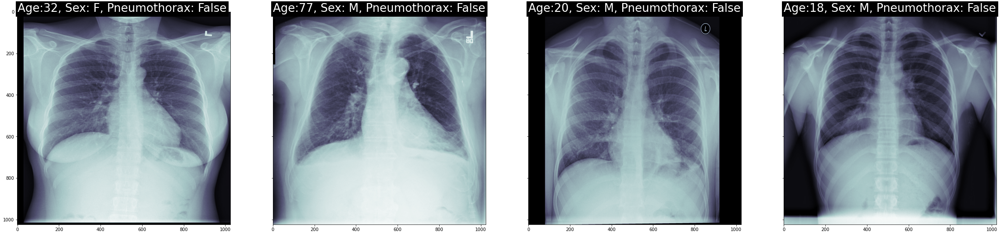

In [13]:
num_img = 4
subplot_count = 0
fig, ax = plt.subplots(nrows=1, ncols=num_img, sharey=True, figsize=(num_img*10,10))
for index, row in train_metadata_df.sample(n=num_img).iterrows():
    dataset = pydicom.dcmread(row['file_path'])
    ax[subplot_count].imshow(dataset.pixel_array, cmap=plt.cm.bone)
    # label the x-ray with information about the patient
    ax[subplot_count].text(0,0,'Age:{}, Sex: {}, Pneumothorax: {}'.format(row['patient_age'],row['patient_sex'],row['has_pneumothorax']),
                           size=26,color='white', backgroundcolor='black')
    subplot_count += 1

In [14]:
def bounding_box(img):
    # return max and min of a mask to draw bounding box
    rows = np.any(img, axis=1)
    cols = np.any(img, axis=0)
    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]

    return rmin, rmax, cmin, cmax

def plot_with_mask_and_bbox(file_path, mask_encoded_list, figsize=(20,10)):
    
    import cv2
    
    """Plot Chest Xray image with mask(annotation or label) and without mask.

    Args:
        file_path (str): file path of the dicom data.
        mask_encoded (numpy.ndarray): Pandas dataframe of the RLE.
        
    Returns:
        plots the image with and without mask.
    """
    
    pixel_array = pydicom.dcmread(file_path).pixel_array
    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))
    clahe_pixel_array = clahe.apply(pixel_array)
    
    # use the masking function to decode RLE
    mask_decoded_list = [rle2mask(mask_encoded, 1024, 1024).T for mask_encoded in mask_encoded_list]
    
    fig, ax = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(20,10))
    
    # print out the xray
    ax[0].imshow(pixel_array, cmap=plt.cm.bone)
    # print the bounding box
    for mask_decoded in mask_decoded_list:
        # print out the annotated area
        ax[0].imshow(mask_decoded, alpha=0.3, cmap="Reds")
        rmin, rmax, cmin, cmax = bounding_box(mask_decoded)
        bbox = patches.Rectangle((cmin,rmin),cmax-cmin,rmax-rmin,linewidth=1,edgecolor='r',facecolor='none')
        ax[0].add_patch(bbox)
    ax[0].set_title('With Mask')
    
    # plot image with clahe processing with just bounding box and no mask
    ax[1].imshow(clahe_pixel_array, cmap=plt.cm.bone)
    for mask_decoded in mask_decoded_list:
        rmin, rmax, cmin, cmax = bounding_box(mask_decoded)
        bbox = patches.Rectangle((cmin,rmin),cmax-cmin,rmax-rmin,linewidth=1,edgecolor='r',facecolor='none')
        ax[1].add_patch(bbox)
    ax[1].set_title('Without Mask - Clahe')
    
    # plot plain xray with just bounding box and no mask
    ax[2].imshow(pixel_array, cmap=plt.cm.bone)
    for mask_decoded in mask_decoded_list:
        rmin, rmax, cmin, cmax = bounding_box(mask_decoded)
        bbox = patches.Rectangle((cmin,rmin),cmax-cmin,rmax-rmin,linewidth=1,edgecolor='r',facecolor='none')
        ax[2].add_patch(bbox)
    ax[2].set_title('Without Mask')
    plt.show()

image id: 1.2.276.0.7230010.3.1.4.8323329.11788.1517875234.836019


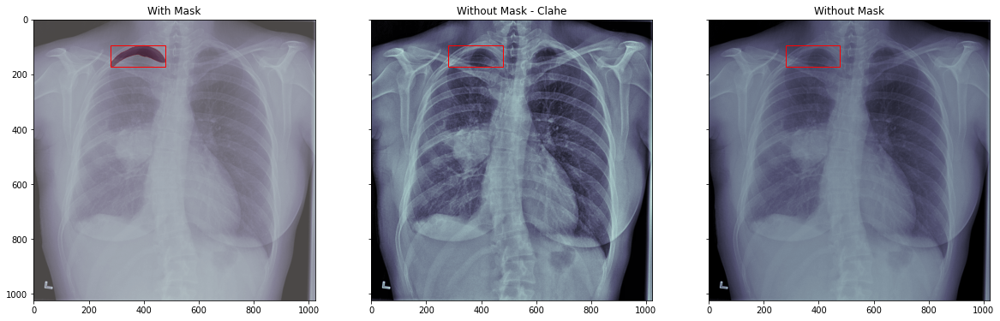

image id: 1.2.276.0.7230010.3.1.4.8323329.2433.1517875172.703107


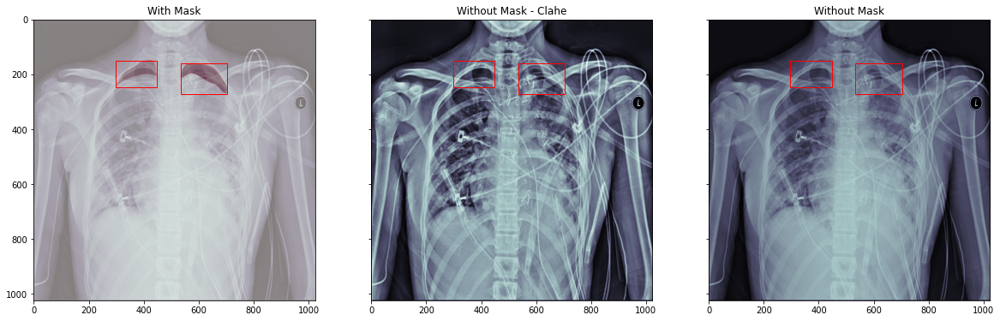

image id: 1.2.276.0.7230010.3.1.4.8323329.444.1517875162.970305


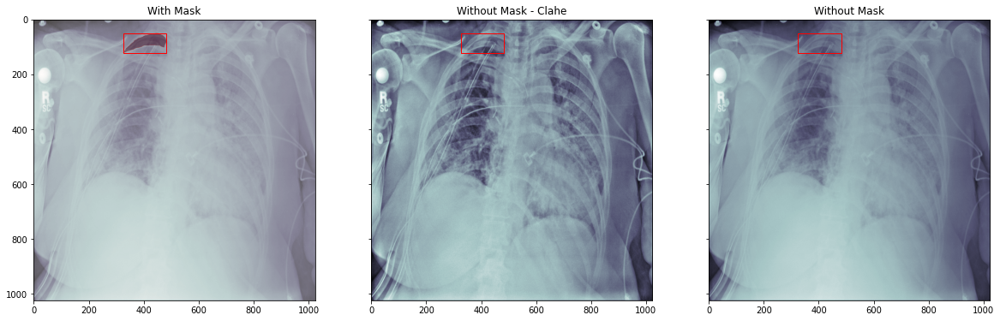

image id: 1.2.276.0.7230010.3.1.4.8323329.12068.1517875237.218872


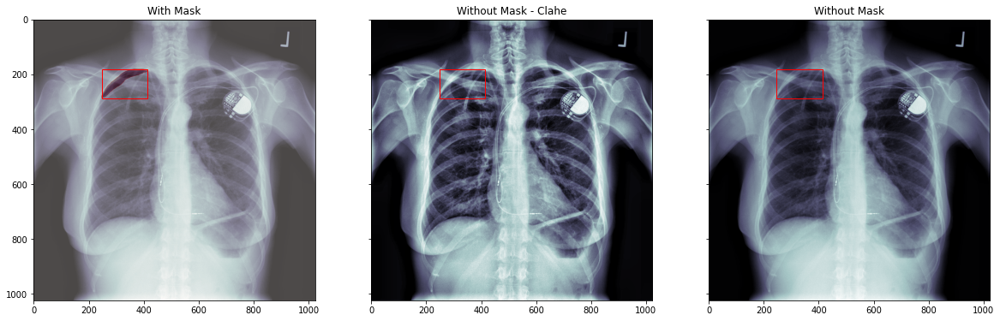

image id: 1.2.276.0.7230010.3.1.4.8323329.32270.1517875159.310960


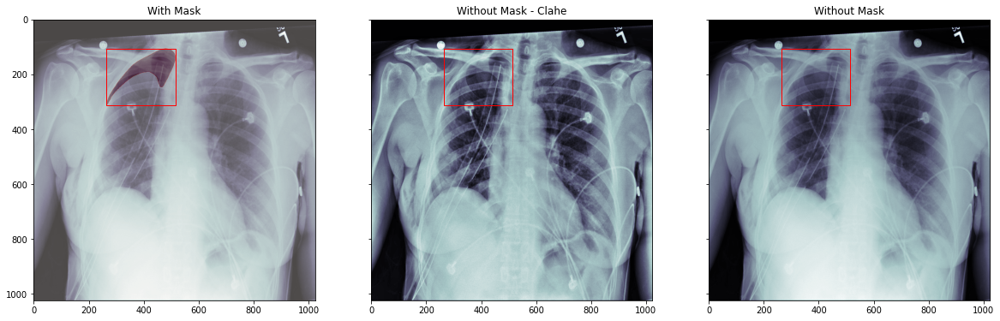

image id: 1.2.276.0.7230010.3.1.4.8323329.32311.1517875159.954516


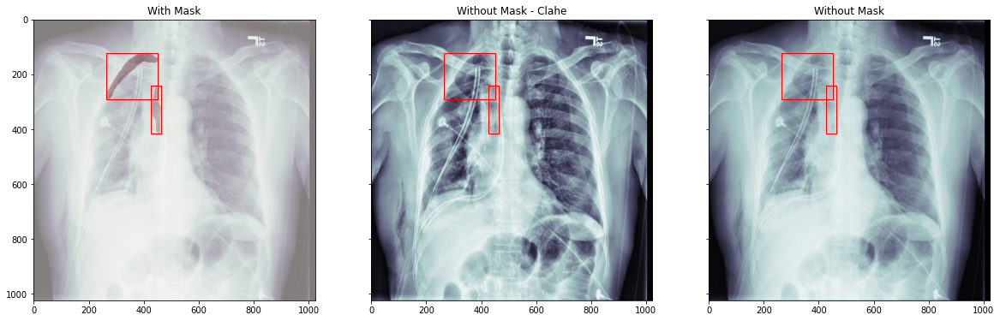

image id: 1.2.276.0.7230010.3.1.4.8323329.11062.1517875230.553648


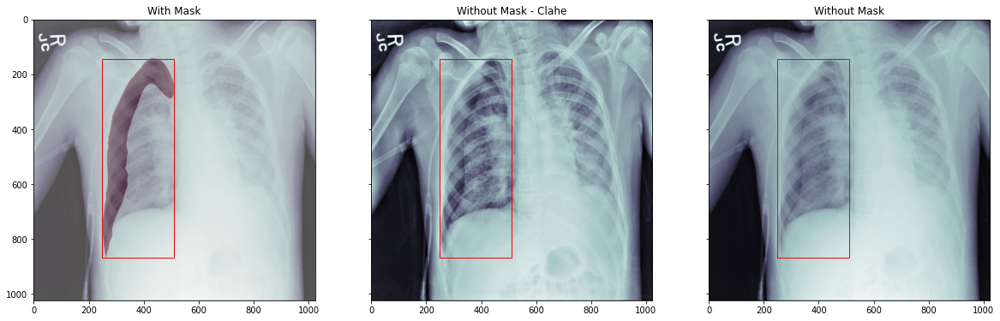

image id: 1.2.276.0.7230010.3.1.4.8323329.32601.1517875161.427223


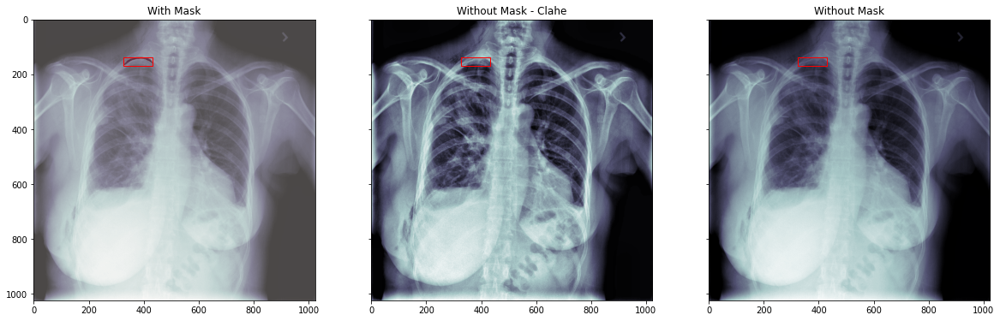

image id: 1.2.276.0.7230010.3.1.4.8323329.14204.1517875250.228481


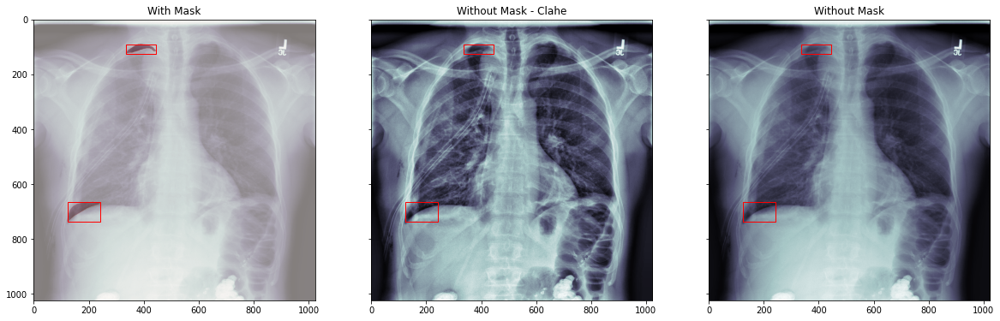

image id: 1.2.276.0.7230010.3.1.4.8323329.11391.1517875232.744682


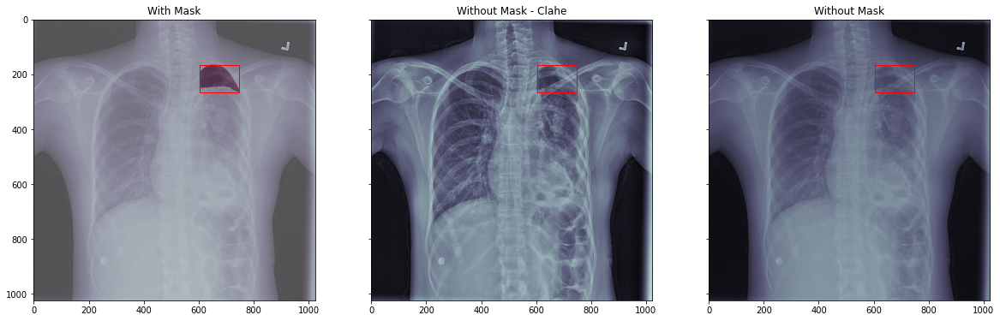

In [15]:
# lets take 10 random samples of x-rays with 
train_metadata_sample = train_metadata_df[train_metadata_df['has_pneumothorax']==1].sample(n=10)
# plot ten xrays with and without mask
for index, row in train_metadata_sample.iterrows():
    file_path = row['file_path']
    mask_encoded_list = row['encoded_pixels_list']
    print('image id: ' + row['id'])
    plot_with_mask_and_bbox(file_path, mask_encoded_list)

In [16]:
# plotly offline imports
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly import tools
from plotly.graph_objs import *
from plotly.graph_objs.layout import Margin, YAxis, XAxis
init_notebook_mode()

In [17]:
# print missing annotation
missing_vals = train_metadata_df[train_metadata_df['encoded_pixels_count']==0]['encoded_pixels_count'].count()
print("Number of x-rays with missing labels: {}".format(missing_vals))

Number of x-rays with missing labels: 1414


In [18]:
nok_count = train_metadata_df['has_pneumothorax'].sum()
ok_count = len(train_metadata_df) - nok_count
x = ['No Pneumothorax','Pneumothorax']
y = [ok_count, nok_count]
trace0 = Bar(x=x, y=y, name = 'Ok vs Not OK')
nok_encoded_pixels_count = train_metadata_df[train_metadata_df['has_pneumothorax']==1]['encoded_pixels_count'].values
trace1 = Histogram(x=nok_encoded_pixels_count, name='# of annotations')
fig = tools.make_subplots(rows=1, cols=2)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)
fig['layout'].update(height=400, width=900, title='Pneumothorax Instances')
iplot(fig)

/opt/conda/lib/python3.7/site-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [19]:
pneumo_pat_age = train_metadata_df[train_metadata_df['has_pneumothorax']==1]['patient_age'].values
no_pneumo_pat_age = train_metadata_df[train_metadata_df['has_pneumothorax']==0]['patient_age'].values

In [20]:
pneumothorax = Histogram(x=pneumo_pat_age, name='has pneumothorax')
no_pneumothorax = Histogram(x=no_pneumo_pat_age, name='no pneumothorax')
fig = tools.make_subplots(rows=1, cols=2)
fig.append_trace(pneumothorax, 1, 1)
fig.append_trace(no_pneumothorax, 1, 2)
fig['layout'].update(height=400, width=900, title='Patient Age Histogram')
iplot(fig)

In [21]:
trace1 = Box(x=pneumo_pat_age, name='has pneumothorax')
trace2 = Box(x=no_pneumo_pat_age[no_pneumo_pat_age <= 120], name='no pneumothorax')
data = [trace1, trace2]
iplot(data)

In [22]:
train_male_df = train_metadata_df[train_metadata_df['patient_sex']=='M']
train_female_df = train_metadata_df[train_metadata_df['patient_sex']=='F']

In [23]:
male_ok_count = len(train_male_df[train_male_df['has_pneumothorax']==0])
female_ok_count = len(train_female_df[train_female_df['has_pneumothorax']==0])
male_nok_count = len(train_male_df[train_male_df['has_pneumothorax']==1])
female_nok_count = len(train_female_df[train_female_df['has_pneumothorax']==1])

In [24]:
ok = Bar(x=['male', 'female'], y=[male_ok_count, female_ok_count], name='no pneumothorax')
nok = Bar(x=['male', 'female'], y=[male_nok_count, female_nok_count], name='has pneumothorax')

data = [ok, nok]
layout = Layout(barmode='stack', height=400)

fig = Figure(data=data, layout=layout)
iplot(fig, filename='stacked-bar')

In [25]:
m_pneumo_labels = ['no pneumothorax','has pneumothorax']
f_pneumo_labels = ['no pneumothorax','has pneumothorax']
m_pneumo_values = [male_ok_count, male_nok_count]
f_pneumo_values = [female_ok_count, female_nok_count]
colors = ['#FEBFB3', '#E1396C']

In [26]:
# original source code: https://plot.ly/python/pie-charts/#donut-chart

fig = {
  "data": [
    {
      "values": m_pneumo_values,
      "labels": m_pneumo_labels,
      "domain": {"column": 0},
      "name": "Male",
      "hoverinfo":"label+percent",
      "hole": .4,
      "type": "pie"
    },
    {
      "values": f_pneumo_values,
      "labels": f_pneumo_labels,
      "textposition":"inside",
      "domain": {"column": 1},
      "name": "Female",
      "hoverinfo":"label+percent",
      "hole": .4,
      "type": "pie"
    }],
  "layout": {
        "title":"Pneumothorax - Male vs Female",
        "grid": {"rows": 1, "columns": 2},
        "annotations": [
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Male",
                "x": 0.20,
                "y": 0.5
            },
            {
                "font": {
                    "size": 20
                },
                "showarrow": False,
                "text": "Female",
                "x": 0.8,
                "y": 0.5
            }
        ]
    }
}
iplot(fig)

In [27]:
def get_affected_area(encoded_pixels_list, pixel_spacing):
    
    # take the encoded mask, decode, and get the sum of nonzero elements
    pixel_sum = 0
    
    for encoded_mask in encoded_pixels_list:
        mask_decoded = rle2mask(encoded_mask, 1024, 1024).T
        pixel_sum += np.count_nonzero(mask_decoded)
        
    area_per_pixel = pixel_spacing[0] * pixel_spacing[1]
    
    return pixel_sum * area_per_pixel

In [28]:
# create a subset of dataframe for pneumothorax patients
pneumothorax_df = train_metadata_df[train_metadata_df['has_pneumothorax']==1].copy()
# get sum of non zero elements in mask
pneumothorax_df['pneumothorax_area'] = pneumothorax_df.apply(lambda row: get_affected_area(row['encoded_pixels_list'], row['pixel_spacing']),axis=1)

In [29]:
pneumothorax_df_m = pneumothorax_df[pneumothorax_df['patient_sex']=='M']
pneumothorax_df_f = pneumothorax_df[pneumothorax_df['patient_sex']=='F']
pneumo_size_m = pneumothorax_df_m['pneumothorax_area'].values
pneumo_size_f = pneumothorax_df_f['pneumothorax_area'].values

In [30]:
pneumo_size_m_trace = Box(x = pneumo_size_m, name='M')
pneumo_size_f_trace = Box(x = pneumo_size_f, name='F')
layout = Layout(title='Pneumothorax Affected Area for Male and Female Population', 
               xaxis = XAxis(title='Area (in sq mm)'))

data = [pneumo_size_m_trace, pneumo_size_f_trace]
fig = Figure(data=data, layout=layout)
iplot(fig)

In [31]:
pneumo_size_m_trace = Scatter(x=pneumothorax_df_m['patient_age'].values, 
                              y=pneumothorax_df_m['pneumothorax_area'].values, 
                              mode='markers', name='Male')

pneumo_size_f_trace = Scatter(x=pneumothorax_df_f['patient_age'].values, 
                              y=pneumothorax_df_f['pneumothorax_area'].values, 
                              mode='markers', name='Female')

layout = Layout(title='Pneumothorax Affected Area vs Age for Male and Female Population', 
                yaxis=YAxis(title='Area (in sq mm)'), xaxis=XAxis(title='Age'))

data = [pneumo_size_m_trace, pneumo_size_f_trace]
fig = Figure(data=data, layout=layout)
iplot(fig)

In [32]:
size_m = pneumothorax_df_m['pneumothorax_area'].values
size_ref_m = 2.*max(size_m)/(40.**2)
size_f = pneumothorax_df_f['pneumothorax_area'].values
size_ref_f = 2.*max(size_f)/(40.**2)

pneumo_size_m_trace = Scatter(x=pneumothorax_df_m['patient_age'].values, 
                              y=pneumothorax_df_m['encoded_pixels_count'].values,
                              marker=dict(size= size_m, sizemode='area', sizeref=size_ref_m, sizemin=4), 
                              mode='markers', name='Male')

pneumo_size_f_trace = Scatter(x=pneumothorax_df_f['patient_age'].values, 
                              y=pneumothorax_df_f['encoded_pixels_count'].values,
                              marker=dict(size=size_f, sizemode='area', sizeref=size_ref_f, sizemin=4), 
                              mode='markers', name='Female')

layout = Layout(title='Pneumothorax Affected Area vs Age for Male and Female Population', yaxis=YAxis(title='Area (in sq mm)'), xaxis=XAxis(title='Age'))

data = [pneumo_size_m_trace, pneumo_size_f_trace]
fig = Figure(data=data, layout=layout)
iplot(fig)

In [33]:
def age_categories(age):
    # take age as input and return age category
    if age <= 14:
        return 'Child'
    if age >=15 and age <= 24:
        return 'Youth'
    if age >=25 and age <=64:
        return 'Adult'
    if age >= 65:
        return 'Senior'

# get age categories
pneumothorax_df['age_category'] = pneumothorax_df['patient_age'].apply(age_categories)

In [34]:
# here we loop over the different age categories and M and F genders to create a subplot
data = []
fig = tools.make_subplots(rows=2, cols=2, subplot_titles=('Child','Youth','Adult','Senior'))
subplot_positions = [(1,1),(1,2),(2,1),(2,2)]

# loop over each age category
for i, cat in enumerate(['Child','Youth','Adult','Senior']):
    # and gender
    for gender in ['M','F']:
        # get affected area for given age group and gender
        values = pneumothorax_df[(pneumothorax_df['patient_sex']==gender) 
                        & (pneumothorax_df['age_category']==cat)]['pneumothorax_area'].values
        # add to the respective trace
        trace = Box(x=values, name=gender)
        # add to figure
        fig.append_trace(trace, subplot_positions[i][0], subplot_positions[i][1])

In [35]:
fig['layout'].update(height=600, width=900, title='Pneumothorax Size in Different Age Categories', showlegend=False)
iplot(fig)

In [36]:
# defining configuration parameters
img_size = 512 # image resize size
batch_size = 16 # batch size for training unet
k_size = 3 # kernel size 3x3
val_size = .25 # split of training set between train and validation set
no_pneumo_drop = 0 # dropping some data to balance the class a little bit better

In [37]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPool2D, UpSampling2D, Concatenate
from sklearn.model_selection import train_test_split
import cv2

In [38]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, file_path_list, labels, batch_size=32, 
                 img_size=256, channels=1, shuffle=True):
        self.file_path_list = file_path_list
        self.labels = labels
        self.batch_size = batch_size
        self.img_size = img_size
        self.channels = channels
        self.shuffle = shuffle
        self.on_epoch_end()
    
    def __len__(self):
        'denotes the number of batches per epoch'
        return int(np.floor(len(self.file_path_list)) / self.batch_size)
    
    def __getitem__(self, index):
        'generate one batch of data'
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        # get list of IDs
        file_path_list_temp = [self.file_path_list[k] for k in indexes]
        # generate data
        X, y = self.__data_generation(file_path_list_temp)
        # return data 
        return X, y
    
    def on_epoch_end(self):
        'update ended after each epoch'
        self.indexes = np.arange(len(self.file_path_list))
        if self.shuffle:
            np.random.shuffle(self.indexes)
            
    def __data_generation(self, file_path_list_temp):
        'generate data containing batch_size samples'
        X = np.empty((self.batch_size, self.img_size, self.img_size, self.channels))
        y = np.empty((self.batch_size, self.img_size, self.img_size, self.channels))
        
        for idx, file_path in enumerate(file_path_list_temp):
            
            id = file_path.split('/')[-1][:-4]
            rle = self.labels.get(id)
            image = pydicom.read_file(file_path).pixel_array
            image_resized = cv2.resize(image, (self.img_size, self.img_size))
            image_resized = np.array(image_resized, dtype=np.float64)
            
            X[idx,] = np.expand_dims(image_resized, axis=2)
            
            # if there is no mask create empty mask
            # notice we are starting of with 1024 because we need to use the rle2mask function
            if rle is None:
                mask = np.zeros((1024, 1024))
            else:
                if len(rle) == 1:
                    mask = rle2mask(rle[0], 1024, 1024).T
                else: 
                    mask = np.zeros((1024, 1024))
                    for r in rle:
                        mask =  mask + rle2mask(r, 1024, 1024).T
                        
            mask_resized = cv2.resize(mask, (self.img_size, self.img_size))
            y[idx,] = np.expand_dims(mask_resized, axis=2)
            
        # normalize 
        X = X / 255
        y = y / 255
            
        return X, y

In [39]:
masks = {}
for index, row in train_metadata_df[train_metadata_df['has_pneumothorax']==1].iterrows():
    masks[row['id']] = list(row['encoded_pixels_list'])

In [40]:
bad_data = train_metadata_df[train_metadata_df['encoded_pixels_count']==0].index
new_train_metadata_df = train_metadata_df.drop(bad_data)

In [41]:
drop_data = new_train_metadata_df[new_train_metadata_df['has_pneumothorax'] == False].sample(no_pneumo_drop).index
new_train_metadata_df = new_train_metadata_df.drop(drop_data)

In [42]:
new_train_metadata_df

,patient_name,patient_id,patient_age,patient_sex,pixel_spacing,file_path,id,encoded_pixels_list,has_pneumothorax,encoded_pixels_count
0,"(1, 7, d, 4, 0, 5, a, 3, -, a, 0, d, 2, -, 4, ...",17d405a3-a0d2-4901-b33a-63906aa48d9f,38,M,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.1000.151787516...,[ -1],False,1
1,"(8, a, b, 1, f, f, d, a, -, 8, b, 6, 5, -, 4, ...",8ab1ffda-8b65-4914-95d6-2e549e328666,10,F,"[0.139, 0.139]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10000.15178752...,[ -1],False,1
2,"(b, f, e, f, 5, 1, d, 3, -, 6, 5, 4, 1, -, 4, ...",bfef51d3-6541-4792-bac1-d21d41ee60fd,50,F,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10001.15178752...,[ -1],False,1
3,"(d, 1, 9, d, 9, 5, 6, f, -, 4, d, d, d, -, 4, ...",d19d956f-4ddd-4688-81ff-909c85e0e2d9,68,F,"[0.139, 0.139]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10002.15178752...,[ -1],False,1
4,"(c, f, 7, 1, a, 7, 6, 0, -, f, 6, 9, 3, -, 4, ...",cf71a760-f693-4ccf-acd4-a41ff4845a5f,65,M,"[0.168, 0.168]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.10003.15178752...,[ -1],False,1
...,...,...,...,...,...,...,...,...,...,...
10707,"(7, 0, d, 6, 9, c, d, 8, -, 6, 8, 0, d, -, 4, ...",70d69cd8-680d-4165-9f57-90ea07972f7a,47,F,"[0.14300000000000002, 0.14300000000000002]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.5792.151787519...,[ -1],False,1
10708,"(d, 9, 2, 1, b, 1, 0, 3, -, c, 9, c, 4, -, 4, ...",d921b103-c9c4-4d5a-9d77-2c5297aea54b,76,M,"[0.171, 0.171]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.5793.151787519...,[ -1],False,1
10709,"(d, 6, d, a, 3, 1, 9, 8, -, e, 7, 5, d, -, 4, ...",d6da3198-e75d-414f-9823-a89c61e04953,58,M,"[0.139, 0.139]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.5794.151787519...,[ -1],False,1
10710,"(d, 1, 2, 8, 6, 2, 0, 4, -, f, 0, 5, 1, -, 4, ...",d1286204-f051-42ff-9b77-468f1188d1b8,16,M,"[0.14300000000000002, 0.14300000000000002]",../input/siim-data/dicom-images-train/1.2.276....,1.2.276.0.7230010.3.1.4.8323329.5795.151787519...,[ 174459 17 982 47 952 76 943 79 936 83 937 83...,True,1


In [43]:
# split the training data into train and validation set (stratified)
X_train, X_val, y_train, y_val = train_test_split(new_train_metadata_df.index, new_train_metadata_df['has_pneumothorax'].values, test_size=val_size, random_state=42)
X_train, X_val = new_train_metadata_df.loc[X_train]['file_path'].values, new_train_metadata_df.loc[X_val]['file_path'].values

In [44]:
params = {'img_size': img_size,
          'batch_size': batch_size,
          'channels': 1,
          'shuffle': True}

# Generators
training_generator = DataGenerator(X_train, masks, **params)
validation_generator = DataGenerator(X_val, masks, **params)

In [45]:
x, y = training_generator.__getitem__(2)
print(x.shape, y.shape)

(16, 512, 512, 1) (16, 512, 512, 1)


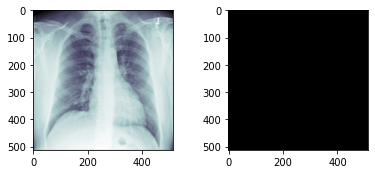

In [46]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)
ax = fig.add_subplot(1, 2, 1)
ax.imshow(x[0].reshape(img_size, img_size), cmap=plt.cm.bone)
ax = fig.add_subplot(1, 2, 2)
ax.imshow(np.reshape(y[0], (img_size, img_size)), cmap="gray")

In [47]:
def down_block(x, filters, kernel_size=3, padding='same', strides=1, activation='relu'):
    'down sampling block of our UNet'
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation=activation)(x)
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation=activation)(conv)
    pool = MaxPool2D((2,2), (2,2))(conv)
    return conv, pool

In [48]:
def up_block(x, skip, filters, kernel_size=3, padding='same', strides=1, activation='relu'):
    'up sampling block of our UNet'
    up_sample = UpSampling2D((2,2))(x)
    concat = Concatenate()([up_sample, skip])
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation=activation)(concat)
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation=activation)(conv)
    return conv

In [49]:
def bottleneck(x, filters, kernel_size=3, padding='same', strides=1, activation='relu'):
    'bottle neck that sits inbetween the down sampling side and the up sampling side'
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation=activation)(x)
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation=activation)(conv)
    return conv

In [50]:
def UNet(img_size):
    'constructing UNet using the blocks defined above'
    
    # number of filters per block
    f = [32,64,128,256,512]
    inputs = Input((img_size, img_size, 1))
    
    p0 = inputs
    c1, p1 = down_block(p0, f[0])
    c2, p2 = down_block(p1, f[1])
    c3, p3 = down_block(p2, f[2])
    c4, p4 = down_block(p3, f[3])
    
    bn = bottleneck(p4, f[4])
    
    u1 = up_block(bn, c4, f[3])
    u2 = up_block(u1, c3, f[2])
    u3 = up_block(u2, c2, f[1])
    u4 = up_block(u3, c1, f[0])
    
    outputs = Conv2D(1, (1,1), padding='same', activation='sigmoid')(u4)
    model = Model(inputs, outputs)
    return model

In [51]:
# defining the loss function and metrics

smooth = 1.

def dice_coef(y_true, y_pred):
    y_true_f = tf.keras.layers.Flatten()(y_true)
    y_pred_f = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [52]:
model = UNet(img_size)
model.compile(optimizer='adam', loss=dice_coef_loss, metrics=[dice_coef])
# model.summary() # enable to see the summary of the model we built

2021-11-22 07:53:26.486310: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-22 07:53:26.599409: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-22 07:53:26.600488: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-11-22 07:53:26.603033: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [53]:
model.fit_generator(generator=training_generator, validation_data=validation_generator, epochs=50, verbose=2)

/opt/conda/lib/python3.7/site-packages/keras/engine/training.py:1972: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.

2021-11-22 07:53:32.261947: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/50


2021-11-22 07:53:35.087795: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


500/500 - 348s - loss: 0.9733 - dice_coef: 0.0267 - val_loss: 0.9818 - val_dice_coef: 0.0182
Epoch 2/50
500/500 - 331s - loss: 0.9818 - dice_coef: 0.0182 - val_loss: 0.9878 - val_dice_coef: 0.0122
Epoch 3/50
500/500 - 333s - loss: 0.9837 - dice_coef: 0.0163 - val_loss: 0.9938 - val_dice_coef: 0.0062
Epoch 4/50
500/500 - 333s - loss: 0.9918 - dice_coef: 0.0082 - val_loss: 0.9877 - val_dice_coef: 0.0123
Epoch 5/50
500/500 - 333s - loss: 0.9758 - dice_coef: 0.0242 - val_loss: 0.9817 - val_dice_coef: 0.0183
Epoch 6/50
500/500 - 333s - loss: 0.9818 - dice_coef: 0.0182 - val_loss: 0.9818 - val_dice_coef: 0.0182
Epoch 7/50
500/500 - 337s - loss: 0.9878 - dice_coef: 0.0122 - val_loss: 0.9637 - val_dice_coef: 0.0363
Epoch 8/50
500/500 - 332s - loss: 0.9838 - dice_coef: 0.0162 - val_loss: 0.9937 - val_dice_coef: 0.0063
Epoch 9/50
500/500 - 335s - loss: 0.9758 - dice_coef: 0.0242 - val_loss: 0.9697 - val_dice_coef: 0.0303
Epoch 10/50
500/500 - 332s - loss: 0.9838 - dice_coef: 0.0162 - val_loss: 0

In [54]:
def plot_train(img, mask, pred):
    
    fig, ax = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(15,5))
    
    ax[0].imshow(img, cmap=plt.cm.bone)
    ax[0].set_title('Chest X-Ray')
    
    ax[1].imshow(mask, cmap=plt.cm.bone)
    ax[1].set_title('Mask')
    
    ax[2].imshow(pred, cmap=plt.cm.bone)
    ax[2].set_title('Pred Mask')
    
    plt.show()

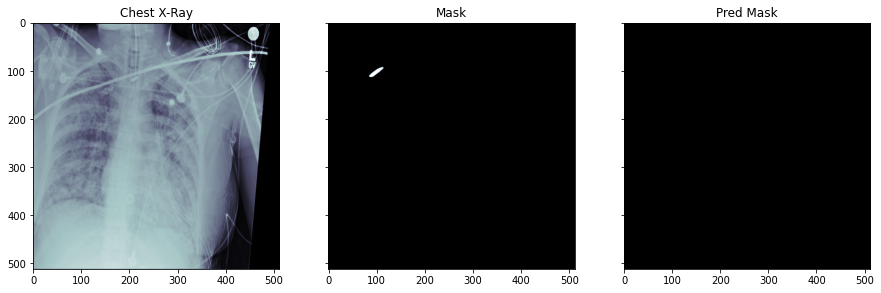

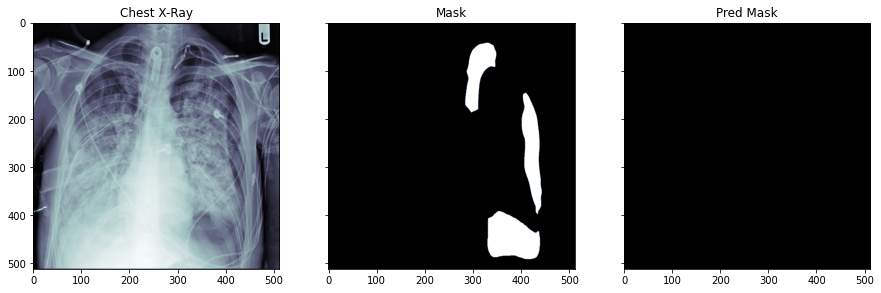

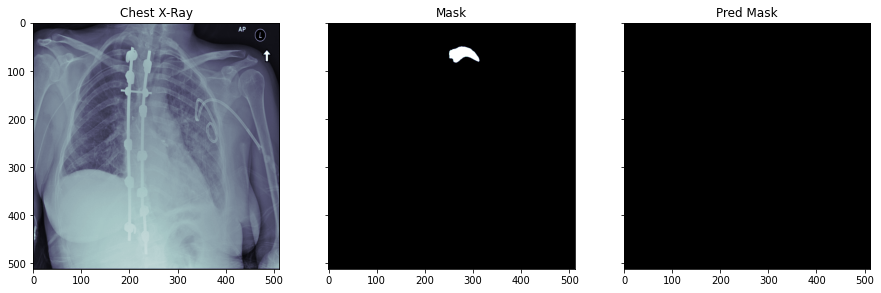

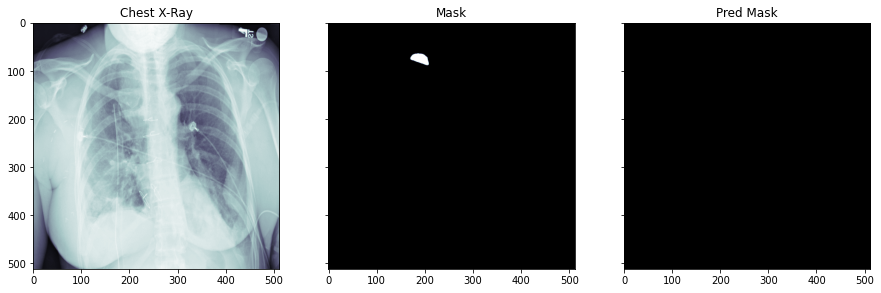

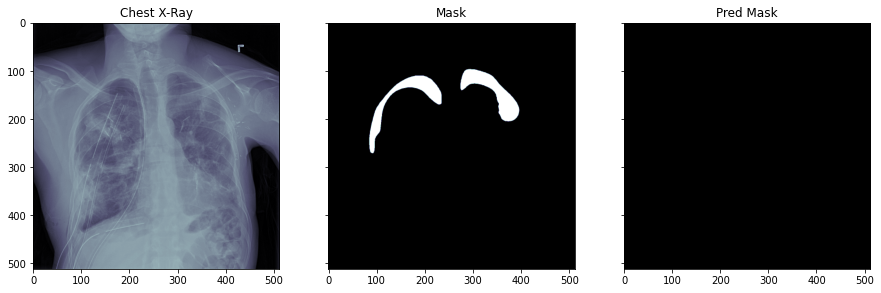

...

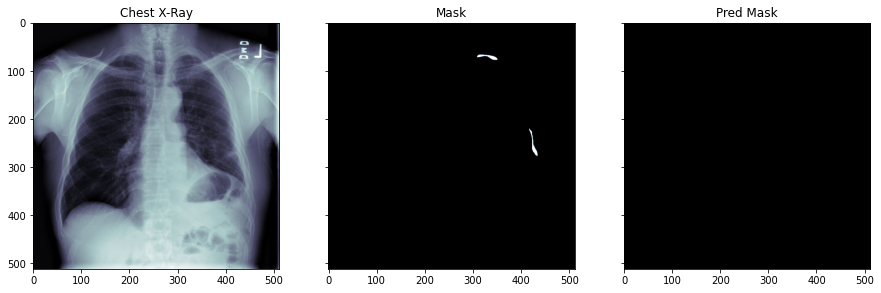

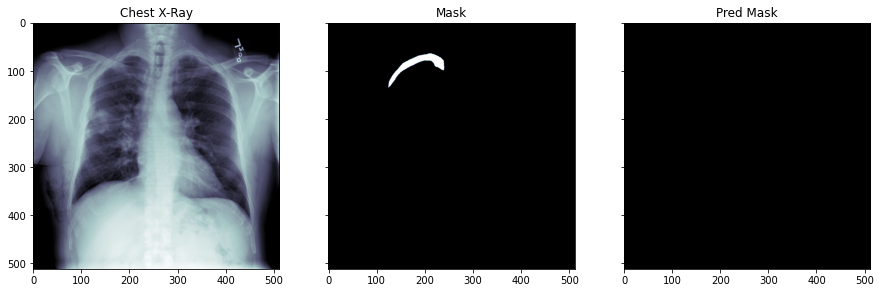

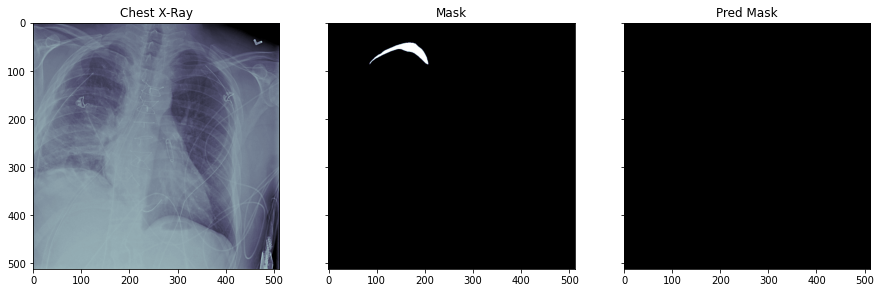

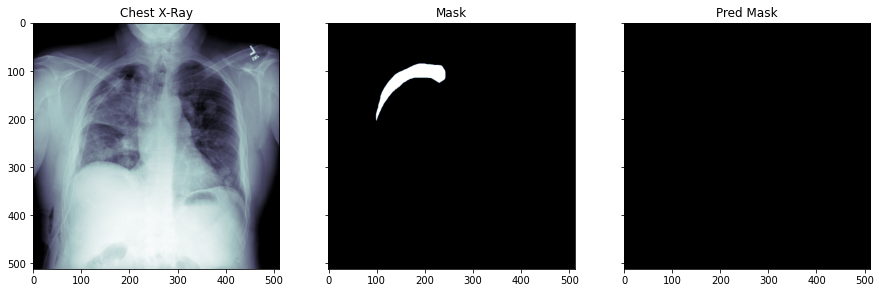

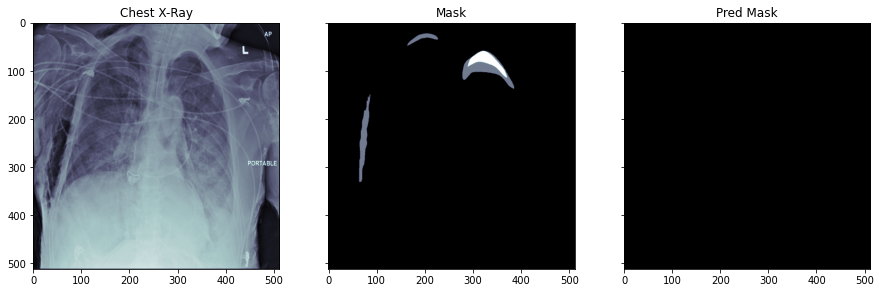

In [55]:
# lets loop over the predictions and print some good-ish results
count = 0
for i in range(0,30):
    if count <= 15:
        x, y = validation_generator.__getitem__(i)
        predictions = model.predict(x)
        for idx, val in enumerate(x):
            if y[idx].sum() > 0 and count <= 15: 
                img = np.reshape(x[idx]* 255, (img_size, img_size))
                mask = np.reshape(y[idx]* 255, (img_size, img_size))
                pred = np.reshape(predictions[idx], (img_size, img_size))
                pred = pred > 0.5
                pred = pred * 255
                plot_train(img, mask, pred)
                count += 1

In [56]:
def get_test_tensor(file_path, batch_size, img_size, channels):
    
        X = np.empty((batch_size, img_size, img_size, channels))

        # Store sample
        pixel_array = pydicom.read_file(file_path).pixel_array
        image_resized = cv2.resize(pixel_array, (img_size, img_size))
        image_resized = np.array(image_resized, dtype=np.float64)
        image_resized -= image_resized.mean()
        image_resized /= image_resized.std()
        X[0,] = np.expand_dims(image_resized, axis=2)

        return X

In [57]:
submission = []

for i, row in test_metadata_df.iterrows():

    test_img = get_test_tensor(test_metadata_df['file_path'][i],1,img_size,1)
    
    pred_mask = model.predict(test_img).reshape((img_size,img_size))
    prediction = {}
    prediction['ImageId'] = str(test_metadata_df['id'][i])
    pred_mask = (pred_mask > .5).astype(int)
    
    
    if pred_mask.sum() < 1:
        prediction['EncodedPixels'] =  -1
    else:
        prediction['EncodedPixels'] = mask2rle(pred_mask * 255, img_size, img_size)
    submission.append(prediction)

In [58]:
submission_df = pd.DataFrame(submission)
submission_df = submission_df[['ImageId','EncodedPixels']]
submission_df.head()

,ImageId,EncodedPixels
0,ID_0011fe81e,-1
1,ID_003206608,-1
2,ID_004d6fbb6,-1
3,ID_004d72c54,-1
4,ID_00528aa0e,-1


In [59]:
submission_df.to_csv('./submission.csv', index=False)